In [1]:
%pip install -q -r requirements.txt


[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import cv2
import matplotlib.pyplot as plt
import numpy as np

CONTENT_ROOT = '/Users/lakhanmankani/dataset'

## Util

In [3]:
def plot_img(rows: int, cols: int, normalize=True, *args):
    plt.gcf().set_dpi(300)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.3,
                    wspace=0.4,
                    hspace=0.2)
    for i, arg in enumerate(args):
        plt.subplot(rows, cols, i+1)
        plt.axis("off")
        if type(arg) == np.ndarray:
            if normalize:
                arg *= (255.0/arg.max())
                arg += arg.min()
                plt.imshow(arg/255)
            else:
                plt.imshow(arg)
        elif type(arg) == PIL.JpegImagePlugin.JpegImageFile:
            plt.imshow(arg)
    plt.show()

## Load image paths

In [4]:
import xml.etree.ElementTree as ET

In [5]:
usability_labels = ['usable', 'unusable', 'partially usable']

In [6]:
tree = ET.parse('annotations.xml')
root = tree.getroot()

In [7]:
all_images = []
labeled_images = []
usable_images = []
unusable_images = []
partially_usable_images = []
significant_rotation_images = []

for child in root:
    if child.tag != 'image':
        continue
    file_name = child.attrib.get('name')
    all_images.append(file_name)
    
    try: 
        next(child.iter('tag'))
    except StopIteration:
        continue
    
    labeled_images.append(file_name)
    
    
    for tag in child.iter('tag'):
        if tag.attrib.get('label') == 'Usability':
            usability = next(tag.iter('attribute')).text
            if usability == 'usable':
                usable_images.append(file_name)
            elif usability == 'partially usable':
                partially_usable_images.append(file_name)
            elif usability == 'unusable':
                unusable_images.append(file_name)

        elif tag.attrib.get('label') == 'Significant rotation':
            significant_rotation_images.append(file_name)
    #print(child.attrib.get('name'), usable.text)

In [8]:
print('all images:', len(all_images))
print('all labeled images:', len(labeled_images))
print('usable images:', len(usable_images))
print('partially usable images:', len(partially_usable_images))
print('unusable images:', len(unusable_images))
print('significant rotation images', len(significant_rotation_images))

all images: 2651
all labeled images: 698
usable images: 627
partially usable images: 39
unusable images: 32
significant rotation images 2


## Classify images

In [20]:
bounding_boxes = {
    # path: ((y_offset, x_offset), (height, width), rotation)
    "2016-07": ((1200, 0), (270, 2000), -19),
    "2016-08": ((1250, 0), (240, 2000), -17),
    "2016-04": ((900, 0), (270, 2000), -24)
}

In [10]:
#img = cv2.imread(f'{CONTENT_ROOT}/{usable_images[0]}', cv2.COLOR_BGR2RGB)
scale_percent = 40 # percent of original size
width = 2000 * scale_percent//100 #int(img.shape[1] * scale_percent / 100)
height = 400 * scale_percent//100 #int(img.shape[0] * scale_percent / 100)

dim = (width, height)

In [11]:
def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result

def resize_img(img, y_offset, x_offset, height, width, rotation, scale=True):
    img_rot = rotate_image(img, rotation)
    img_crop = img_rot[y_offset:y_offset+height, x_offset:x_offset+width, :]
    if scale:
      img_down = cv2.resize(img_crop, dim, interpolation=cv2.INTER_AREA)
      return img_down
    else:
      return img_crop

def load_resized_img(file_name, scale=True, color=False):
    if color: 
       img = cv2.imread(f'{CONTENT_ROOT}/{file_name}', cv2.COLOR_BGR2RGB)
       img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
      img = cv2.imread(f'{CONTENT_ROOT}/{file_name}', cv2.COLOR_BGR2GRAY) # cv2.COLOR_BGR2RGB
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    (y_offset, x_offset), (height, width), rotation = bounding_boxes[file_name.split('/')[1]]   
    return resize_img(img, y_offset, x_offset, height, width, rotation, scale)

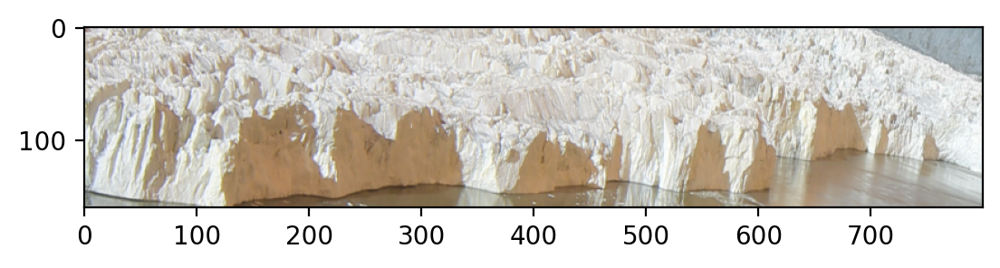

In [12]:
plt.imshow(load_resized_img(usable_images[-1]))

In [13]:
split = 0.8
train_usable_images = usable_images[:int(len(usable_images)*split)]
train_unusable_images = unusable_images[:int(len(unusable_images)*split)]

test_usable_images = usable_images[int(len(usable_images)*split):]
test_unusable_images = unusable_images[int(len(unusable_images)*split):]

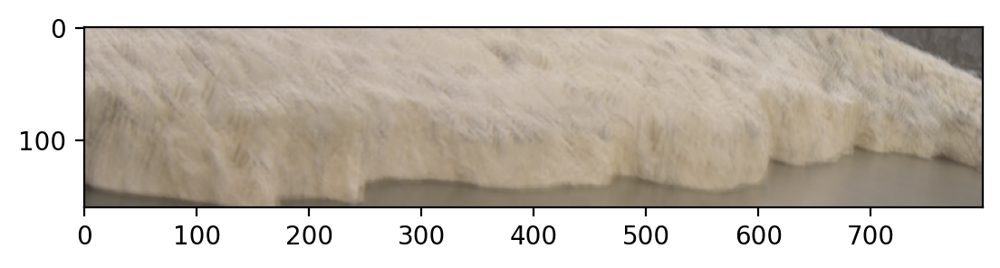

In [13]:
# Calculate average usable image from training data
usable_images_total = np.zeros((height, width, 3))
for file_name in train_usable_images:
    img_down = load_resized_img(file_name)
    usable_images_total = np.add(usable_images_total, np.float32(img_down))
usable_images_avg = (usable_images_total/len(train_usable_images)).astype(int)
plt.imshow(usable_images_avg)

In [14]:
def normalize(arr):
    # Normalizes an array to be between 0 and 1
    return arr / np.max(np.add(arr, -np.min(arr)))

### SIFT

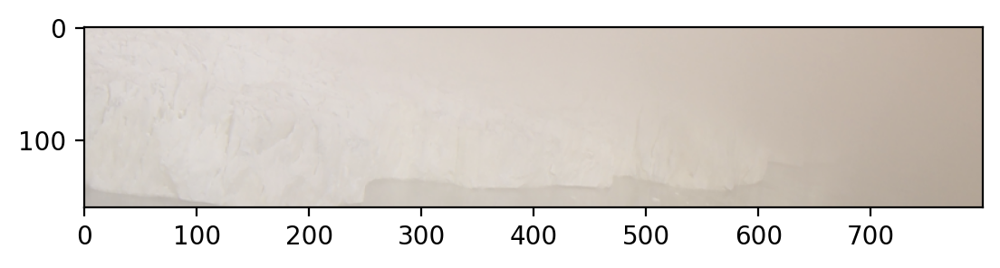

In [15]:
plt.imshow(load_resized_img(train_unusable_images[2]))

In [14]:
def classify(img, threshold=20):
    sift = cv2.SIFT_create()
    kp = sift.detect(img, None)
    if len(kp) > threshold:
        return 'usable'
    return 'unusable'

In [54]:
usable_correct = 0
usable_incorrect = 0
unusable_correct = 0
unusable_incorrect = 0

for file_name in train_usable_images:
    img = load_resized_img(file_name)
    if classify(img, threshold=50) == 'usable':
        usable_correct += 1
    else:
        usable_incorrect += 1
for file_name in train_unusable_images:
    img = load_resized_img(file_name)
    if classify(img, threshold=50) == 'unusable':
        unusable_correct += 1
    else:
        unusable_incorrect += 1
usable_accuracy = usable_correct / (usable_correct + usable_incorrect)
unusable_accuracy = unusable_correct / (unusable_correct + unusable_incorrect)
print(f'usable accuracy {usable_accuracy * 100}%')
print(f'unusable accuracy {unusable_accuracy * 100}%')

usable accuracy 100.0%
unusable accuracy 96.0%


In [55]:
for file_name in train_unusable_images:
    img = load_resized_img(file_name)
    if classify(img, threshold=50) == 'unusable':
        continue
    else:
        print(file_name)

2016/2016-07/20160701_1733_IMG_3541.JPG


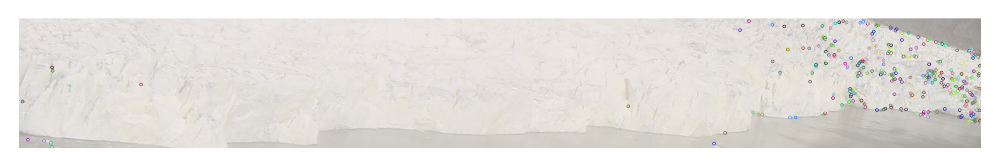

True

In [69]:
# img = load_resized_img('2016/2016-07/20160701_1733_IMG_3541.JPG')
img = load_resized_img('2016/2016-07/20160705_1423_IMG_3915.JPG', scale=False)
kp = sift.detect(img, None)
img_kp = cv2.drawKeypoints(img,kp,img)
plot_img(1, 1, False, img)
cv2.imwrite('incorrect-unusable-kp.png', img)

In [18]:
usable_correct = 0
usable_incorrect = 0
unusable_correct = 0
unusable_incorrect = 0

for file_name in test_usable_images:
    img = load_resized_img(file_name)
    if classify(img, threshold=50) == 'usable':
        usable_correct += 1
    else:
        usable_incorrect += 1
for file_name in test_unusable_images:
    img = load_resized_img(file_name)
    if classify(img, threshold=50) == 'unusable':
        unusable_correct += 1
    else:
        unusable_incorrect += 1
usable_accuracy = usable_correct / (usable_correct + usable_incorrect)
unusable_accuracy = unusable_correct / (unusable_correct + unusable_incorrect)
print(f'usable accuracy {usable_accuracy * 100}%')
print(f'unusable accuracy {unusable_accuracy * 100}%')

usable accuracy 100.0%
unusable accuracy 100.0%


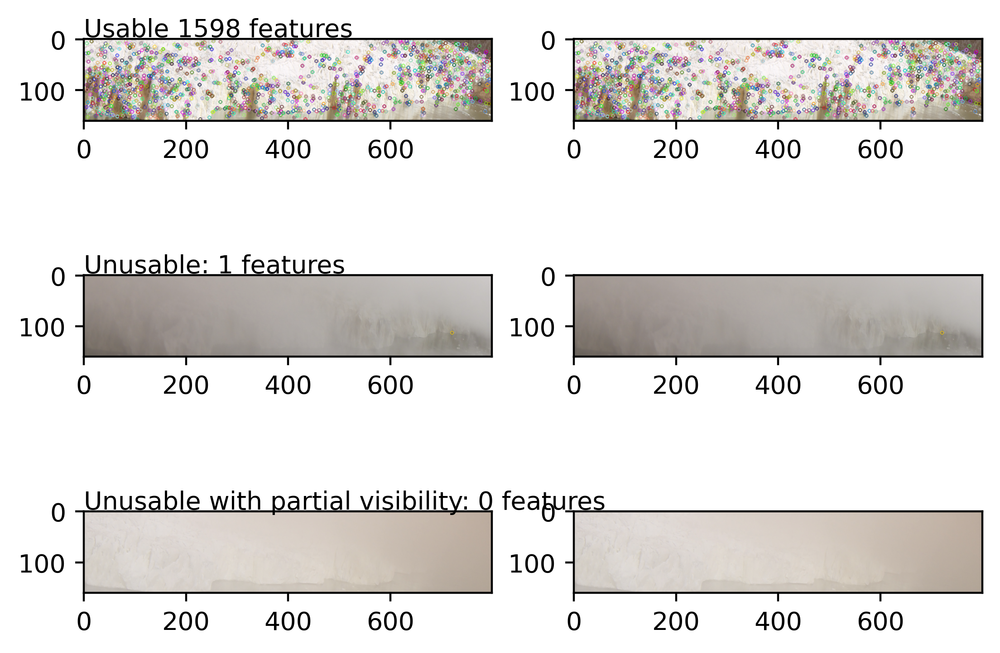

In [15]:
usable_img_down = load_resized_img(train_usable_images[1])
unusable_img_down = load_resized_img(train_unusable_images[0]) # [2]
unusable_img_down2 = load_resized_img(train_unusable_images[2])

# Usable SIFT
sift = cv2.SIFT_create()
kp = sift.detect(usable_img_down, None)
img_kp = cv2.drawKeypoints(usable_img_down,kp,usable_img_down)

plt.gcf().set_dpi(200)

#plt.figure(figsize=(16,16))
plt.subplot(3, 2, 1)
plt.text(0,-5,f'Usable {len(kp)} features')
plt.imshow(usable_img_down)
plt.subplot(3, 2, 2)
plt.imshow(img_kp)

# Unusable SIFT
kp = sift.detect(unusable_img_down, None)
img_kp = cv2.drawKeypoints(unusable_img_down,kp,unusable_img_down)
plt.subplot(3, 2, 3)
plt.text(0,-5,f'Unusable: {len(kp)} features')
plt.imshow(unusable_img_down)
plt.subplot(3, 2, 4)
plt.imshow(img_kp)

# Unusable SIFT with partial visibility
kp = sift.detect(unusable_img_down2, None)
img_kp = cv2.drawKeypoints(unusable_img_down2,kp,unusable_img_down2)
plt.subplot(3, 2, 5)
plt.text(0,-5, f'Unusable with partial visibility: {len(kp)} features')
plt.imshow(unusable_img_down2)
plt.subplot(3, 2, 6)
plt.imshow(img_kp)

In [27]:
import glob
from scipy import stats

FEATURES_THRESHOLD = 50

def dataset_features(dataset, threshold=FEATURES_THRESHOLD):
    features = []

    for path in dataset:
        path = path.split('dataset/')[-1]
        img = load_resized_img(path)
        feat = sift.detect(img, None)
        features.append(len(feat))

    print(f'feat avg: {np.average(features)}')
    print(f'feat med: {np.median(features)}')
    print(f'feat min: {np.min(features)}')
    print(f'feat max: {np.max(features)}')
    print(f'feat std: {np.std(features)}')
    print(f'num images: {len(features)}')
    print(f'<{threshold} feat: {(np.array(features) < threshold).sum()}')
    print(f'>={threshold} feat: {(np.array(features) >= threshold).sum()}')

    plt.plot(sorted(features), stats.norm.pdf(sorted(features), np.average(features), np.std(features)))
    plt.axvline(x = np.average(features), label='no. features mean', linestyle='--')

    plt.legend()
    return features

In [18]:
import os
import shutil

def save_dataset(dataset, features, output_path, threshold=FEATURES_THRESHOLD):
    usable = [x for x, n in zip(dataset, features) if n >= threshold]
    unusable = [x for x, n in zip(dataset, features) if n < threshold]

    unprocessed_usable_path = f'{output_path}/unprocessed/usable'
    unprocessed_unusable_path = f'{output_path}/unprocessed/unusable'
    processed_usable_path = f'{output_path}/processed/usable'
    processed_unusable_path = f'{output_path}/processed/unusable'
    
    #os.makedirs(output_path, exist_ok=True)
    os.makedirs(unprocessed_usable_path, exist_ok=True)
    os.makedirs(processed_usable_path, exist_ok=True)
    os.makedirs(processed_unusable_path, exist_ok=True)
    os.makedirs(unprocessed_unusable_path, exist_ok=True)
    
    for path in usable:
        # Save unprocessed image
        shutil.copy(path, unprocessed_usable_path)

        # Save processed image
        path = path.split('dataset/')[-1]
        img = load_resized_img(path, scale=False)
        cv2.imwrite(f'{processed_usable_path}/{path.split("/")[-1]}', img)
    for path in unusable:
        shutil.copy(path, unprocessed_unusable_path)

        path = path.split('dataset/')[-1]
        img = load_resized_img(path, scale=False)
        cv2.imwrite(f'{processed_unusable_path}/{path.split("/")[-1]}', img)        
    

### July 2016

feat avg: 701.9185213127122
feat med: 683.0
feat min: 0
feat max: 2392
feat std: 425.7428807723393
num images: 2651
<10 feat: 171
>=10 feat: 2480


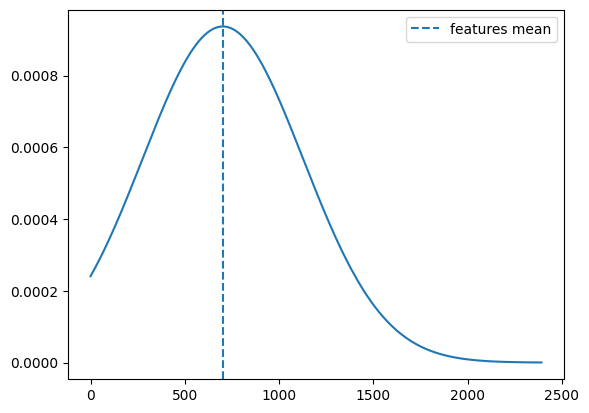

In [107]:
l = glob.glob(f'{CONTENT_ROOT}/2016/2016-07/*.JPG')
# l = glob.glob(f'{CONTENT_ROOT}/2016/2016-07/20160701*.JPG')
features = dataset_features(l)
output_path = '/Users/lakhanmankani/Desktop/dataset/July-2016'
shutil.rmtree(output_path, ignore_errors=True)
save_dataset(l, features, output_path)

375

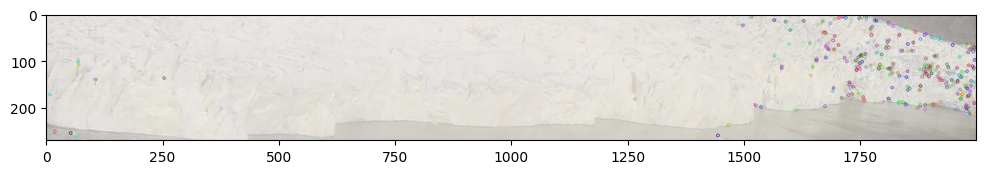

In [108]:
i = l.index(f'{CONTENT_ROOT}/2016/2016-07/20160705_1423_IMG_3915.JPG')
img = load_resized_img('2016/2016-07/20160705_1423_IMG_3915.JPG', scale=False)
kp = sift.detect(img, None)
img_kp = cv2.drawKeypoints(img,kp,img)
plt.figure(figsize=(12, 12))
plt.imshow(img_kp)
len(kp)

### August 2016

feat avg: 642.7859414758269
feat med: 623.0
feat min: 0
feat max: 2072
feat std: 442.30649114065335
num images: 3144
<10 feat: 273
>=10 feat: 2871


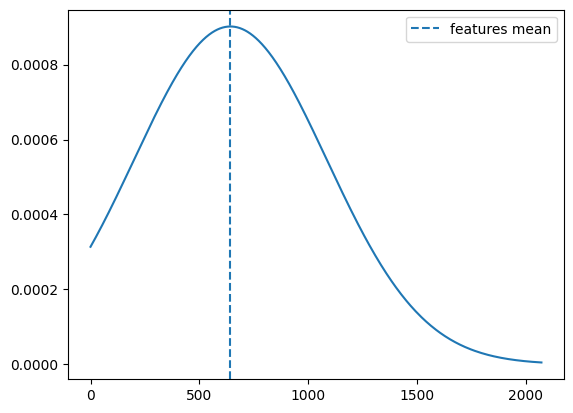

In [66]:
l = glob.glob(f'{CONTENT_ROOT}/2016/2016-08/*.JPG')
features = dataset_features(l)
output_path = '/Users/lakhanmankani/Desktop/dataset/August-2016'
shutil.rmtree(output_path, ignore_errors=True)
save_dataset(l, features, output_path)

'usable'

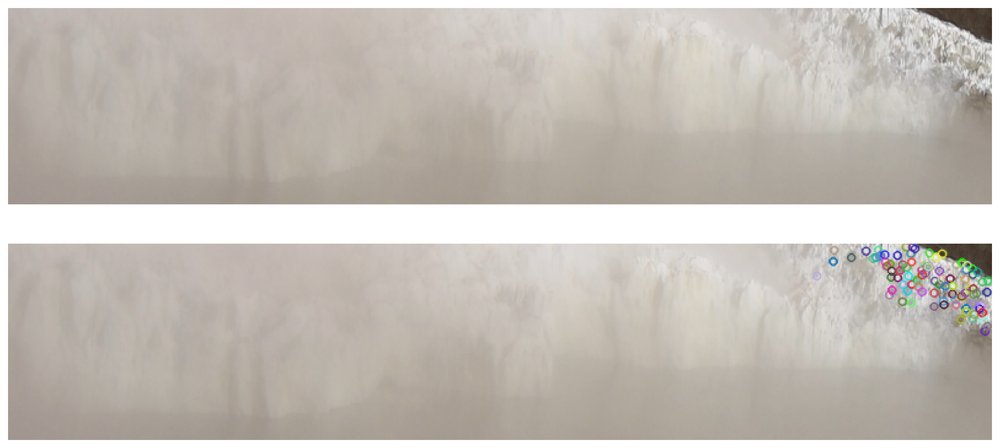

In [97]:
img = load_resized_img('2016/2016-08/20160803_1028_IMG_6833.JPG')
plt.figure(figsize=(20, 7))
plt.subplot(2,1,1)
plt.axis('off')
plt.imshow(img)

kp = sift.detect(img)
img_kp = cv2.drawKeypoints(img,kp,img)
plt.subplot(2,1,2)
plt.axis('off')
plt.imshow(img_kp)
classify(img)

## Evaluation

feat avg: 858.4885931558936
feat med: 771.5
feat min: 0
feat max: 2310
feat std: 450.57412347405017
num images: 526
<50 feat: 24
>=50 feat: 502


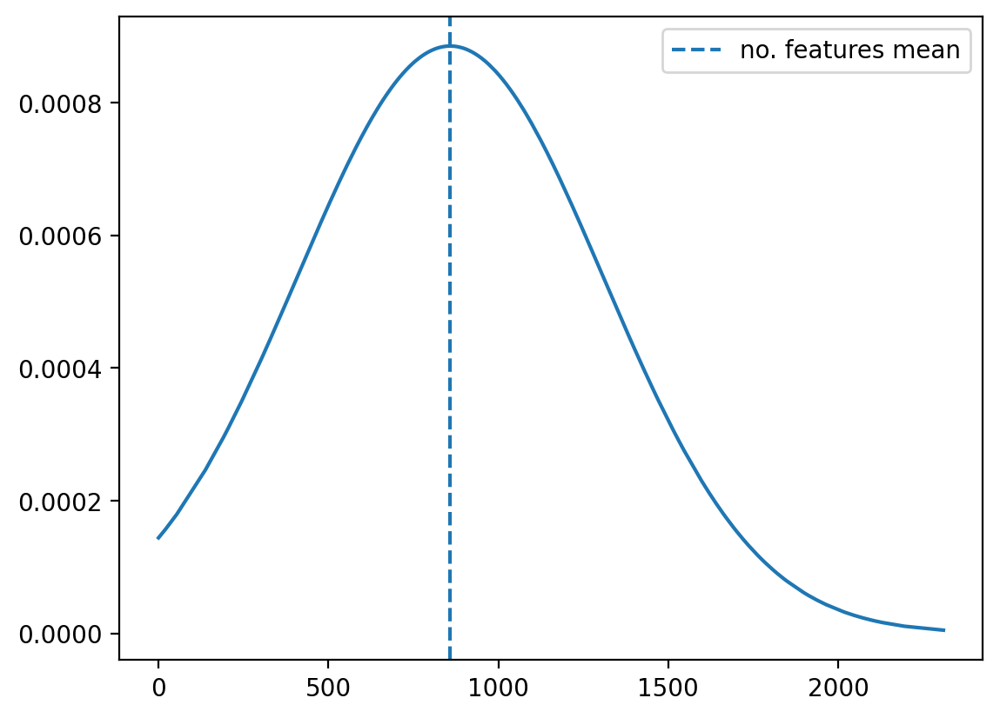

In [61]:
features = dataset_features(train_usable_images+train_unusable_images, threshold=50)

feat avg: 901.0059880239521
feat med: 787.0
feat min: 54
feat max: 2310
feat std: 418.4210673291942
num images: 501
<50 feat: 0
>=50 feat: 501
feat avg: 6.44
feat med: 0.0
feat min: 0
feat max: 138
feat std: 27.166273207784688
num images: 25
<50 feat: 24
>=50 feat: 1


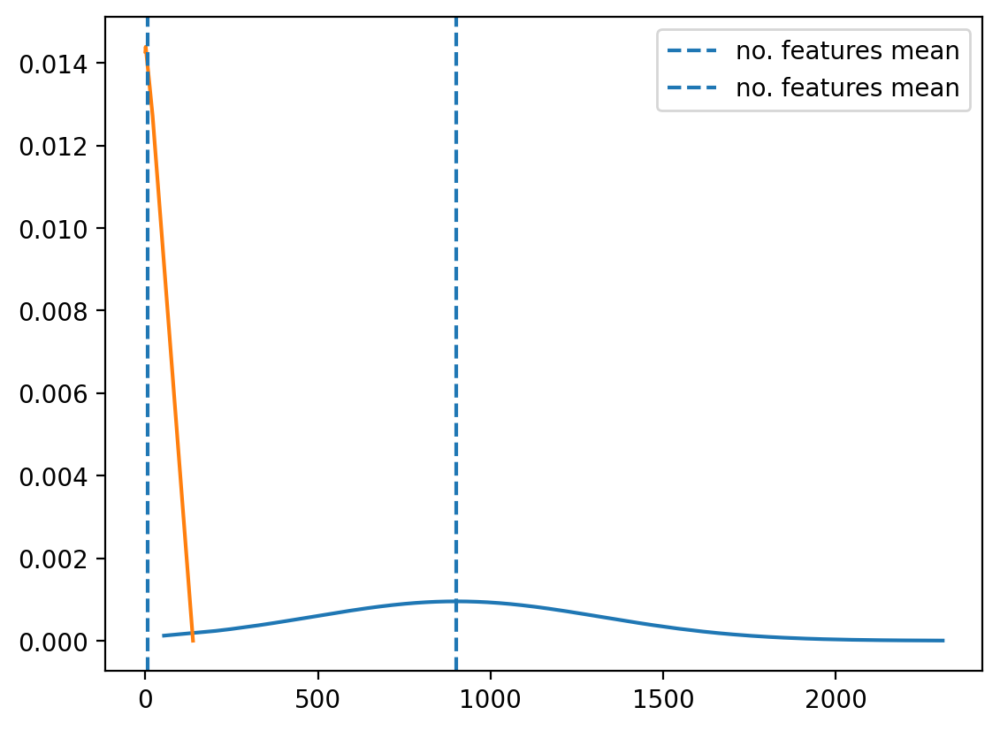

In [102]:
train_usable_features = dataset_features(train_usable_images, threshold=50)
train_unusable_features = dataset_features(train_unusable_images, threshold=50)
train_all_features = train_usable_features+train_unusable_features#dataset_features(train_unusable_images, threshold=50)

f1 0.9990029910269193


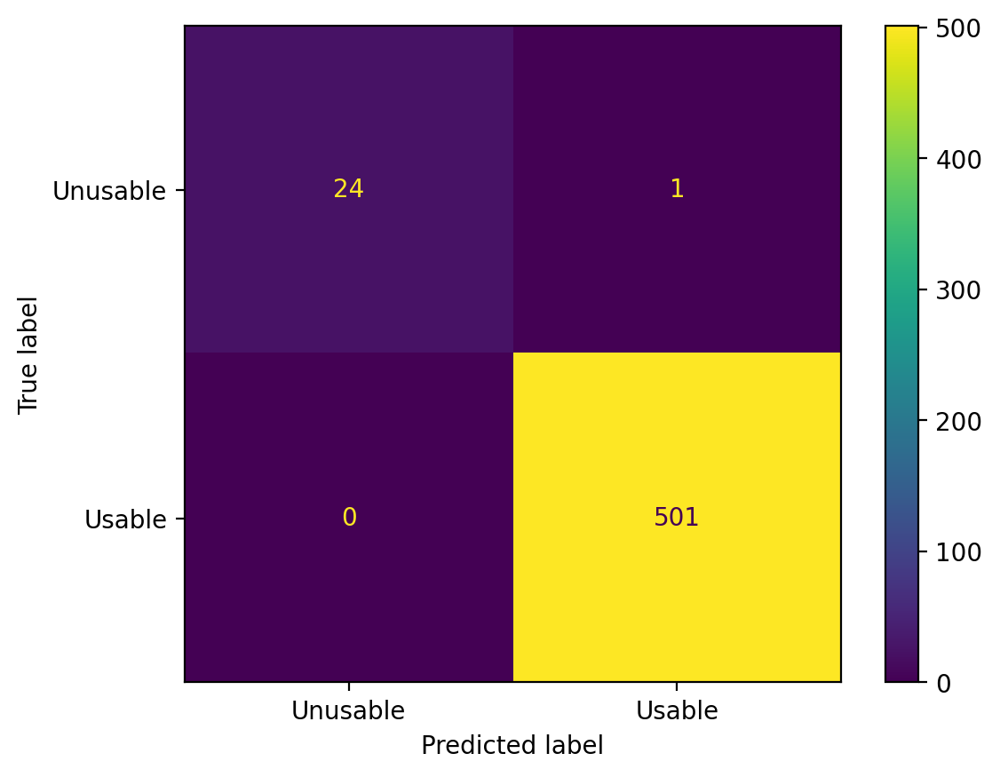

In [124]:
# July 2016 training
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score
preds = list(np.array(train_usable_features) >= 50)+list(np.array(train_unusable_features) >= 50)
trues = [True for _ in range(len(train_usable_features))]+[False for _ in range(len(train_unusable_features))]

print(f'f1 {f1_score(trues, preds)}')
matrix = confusion_matrix(trues, preds)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels = ["Unusable", "Usable"]).plot()
plt.savefig('july-train-usability-confusion-matrix.png', dpi=300)

feat avg: 922.0714285714286
feat med: 842.0
feat min: 240
feat max: 2275
feat std: 409.016361270363
num images: 126
<50 feat: 0
>=50 feat: 126
feat avg: 0.0
feat med: 0.0
feat min: 0
feat max: 0
feat std: 0.0
num images: 7
<50 feat: 7
>=50 feat: 0
f1 1.0


/Users/lakhanmankani/University/PRBX/usability/venv/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2093: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


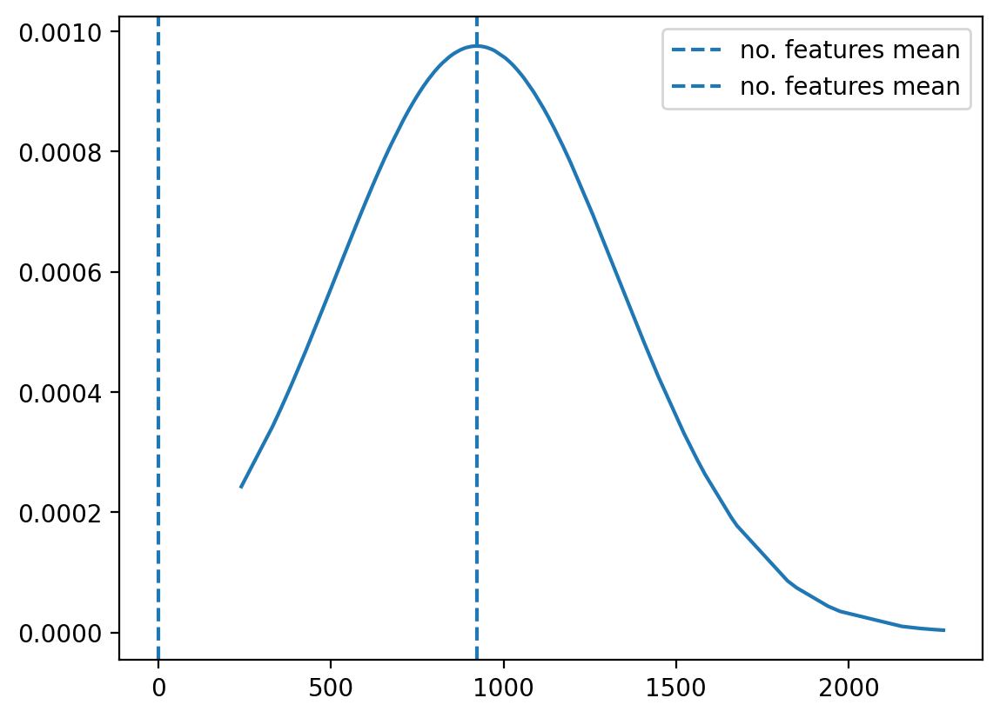

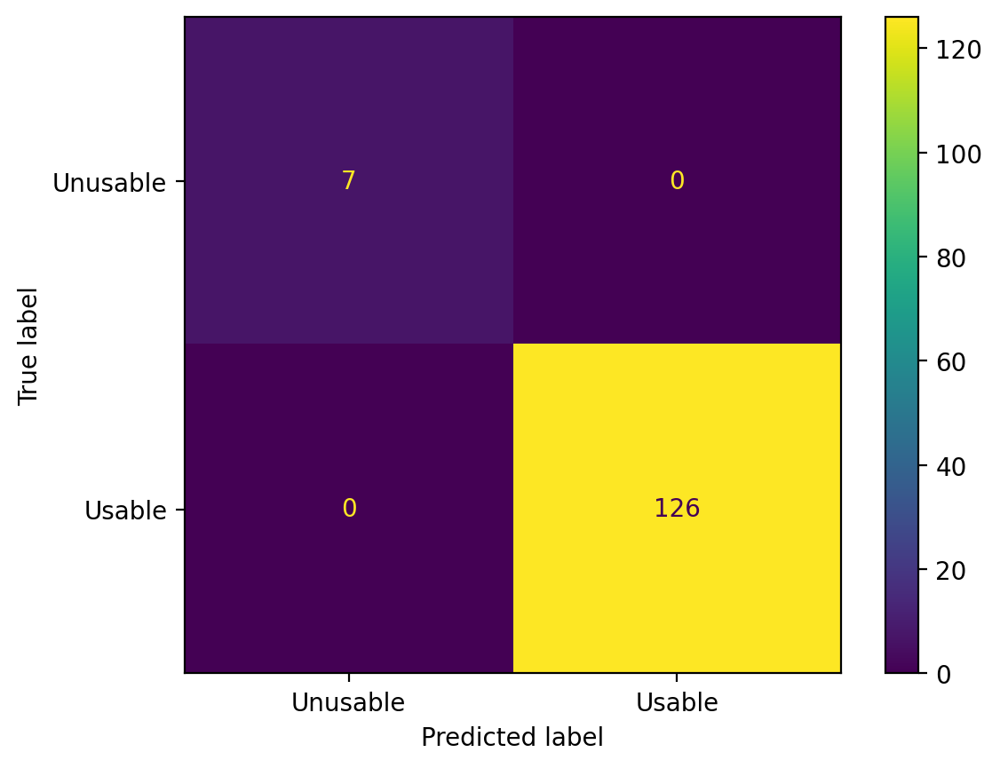

In [125]:
# July 2016 testing
test_usable_features = dataset_features(test_usable_images, threshold=50)
test_unusable_features = dataset_features(test_unusable_images, threshold=50)

preds = list(np.array(test_usable_features) >= 50)+list(np.array(test_unusable_features) >= 50)
trues = [True for _ in range(len(test_usable_features))]+[False for _ in range(len(test_unusable_features))]

print(f'f1 {f1_score(trues, preds)}')
matrix = confusion_matrix(trues, preds)
cm_display = ConfusionMatrixDisplay(confusion_matrix = matrix, display_labels = ["Unusable", "Usable"]).plot()
plt.savefig('july-test-usability-confusion-matrix.png', dpi=300)

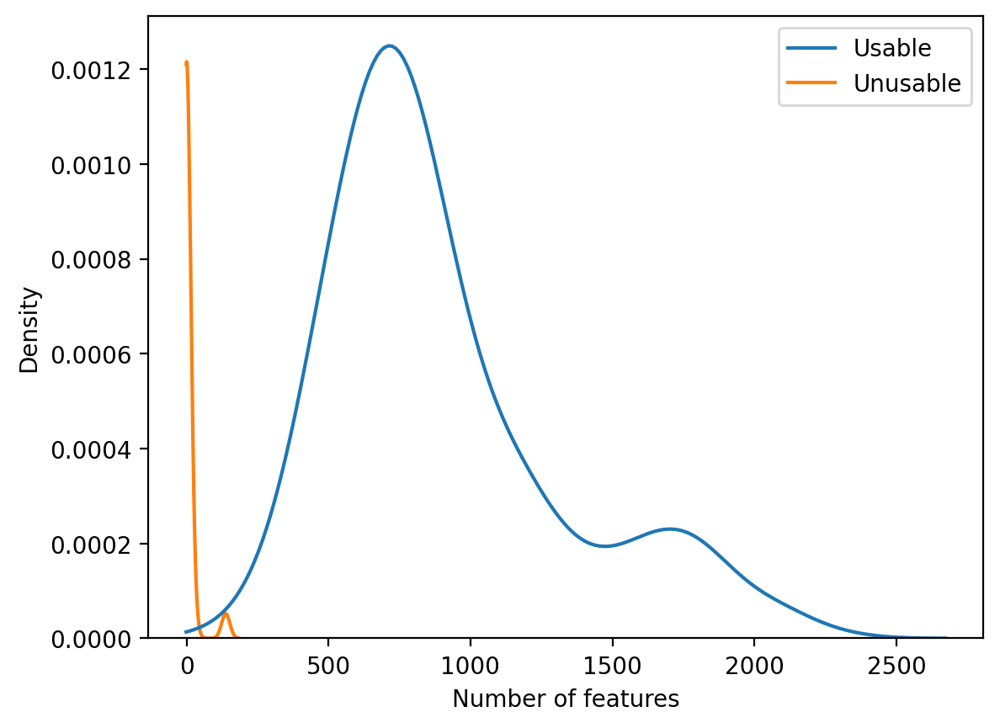

In [101]:
import seaborn as sns

ax = sns.kdeplot(data={"Usable": train_usable_features, "Unusable": train_unusable_features}, clip=(-1, 100000), common_norm=True)
ax.set(xlabel='Number of features')
plt.savefig('usability-distribution.png', dpi=300)

feat avg: 901.0059880239521
feat med: 787.0
feat min: 54
feat max: 2310
feat std: 418.4210673291942
num images: 501
<50 feat: 0
>=50 feat: 501


(0, 501)

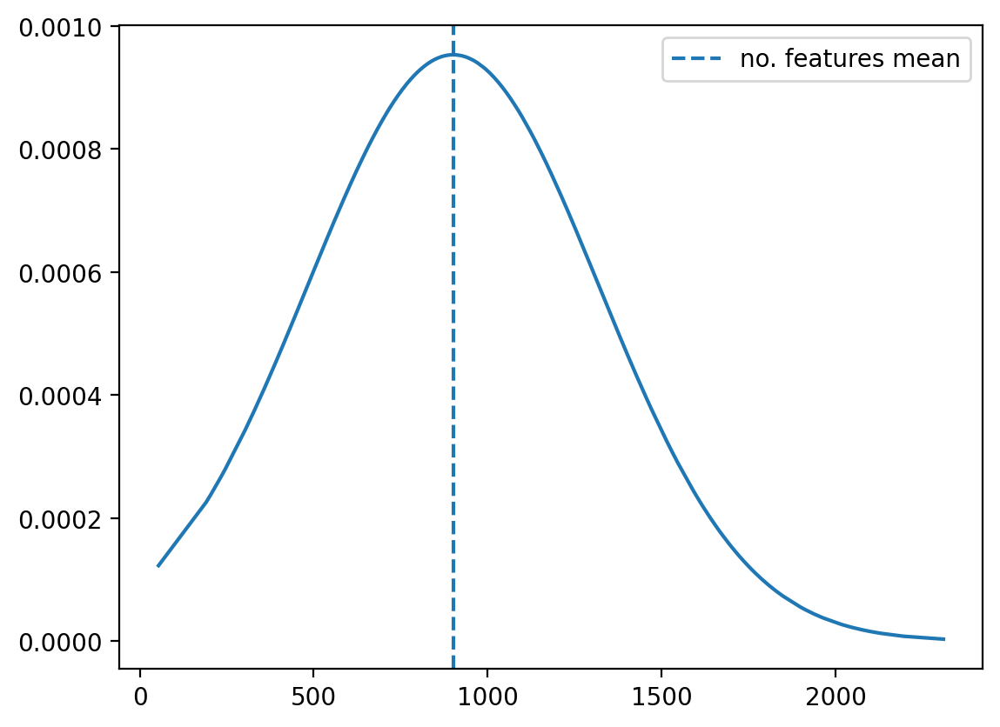

In [60]:
features = dataset_features(train_usable_images, threshold=50)

feat avg: 6.44
feat med: 0.0
feat min: 0
feat max: 138
feat std: 27.166273207784688
num images: 25
<50 feat: 24
>=50 feat: 1


[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 138, 1, 0, 0, 0, 0, 0, 0, 0, 0]

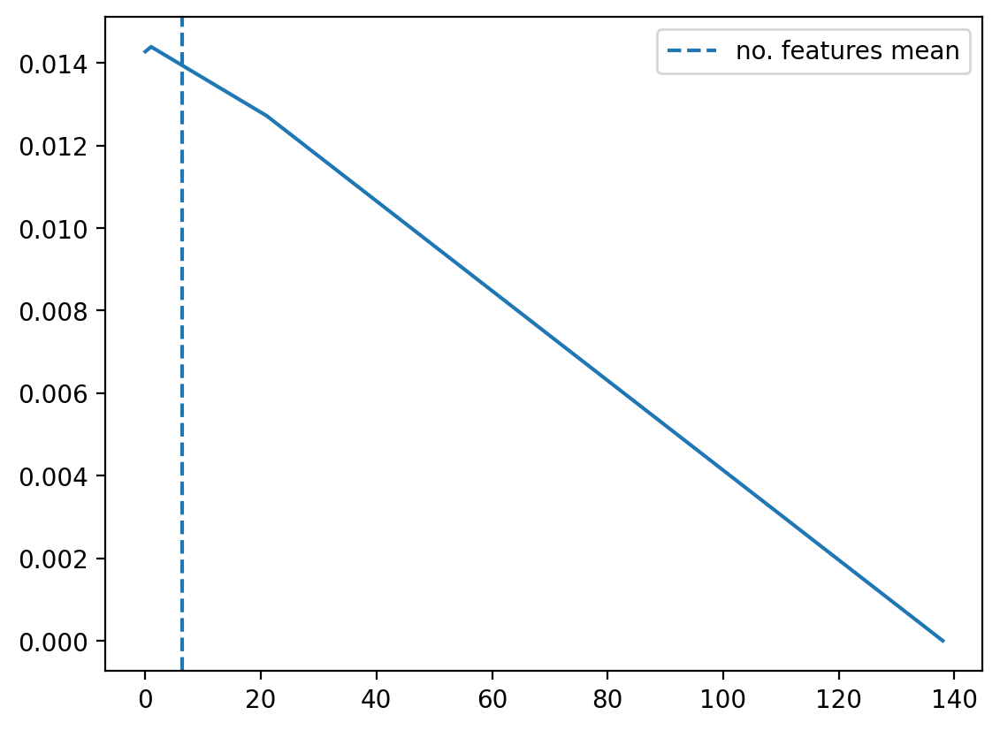

In [53]:
features = dataset_features(train_unusable_images, threshold=50)
(np.array(features) < 50).sum(), len(features)
features

feat avg: 922.0714285714286
feat med: 842.0
feat min: 240
feat max: 2275
feat std: 409.016361270363
num images: 126
<50 feat: 0
>=50 feat: 126


(0, 126)

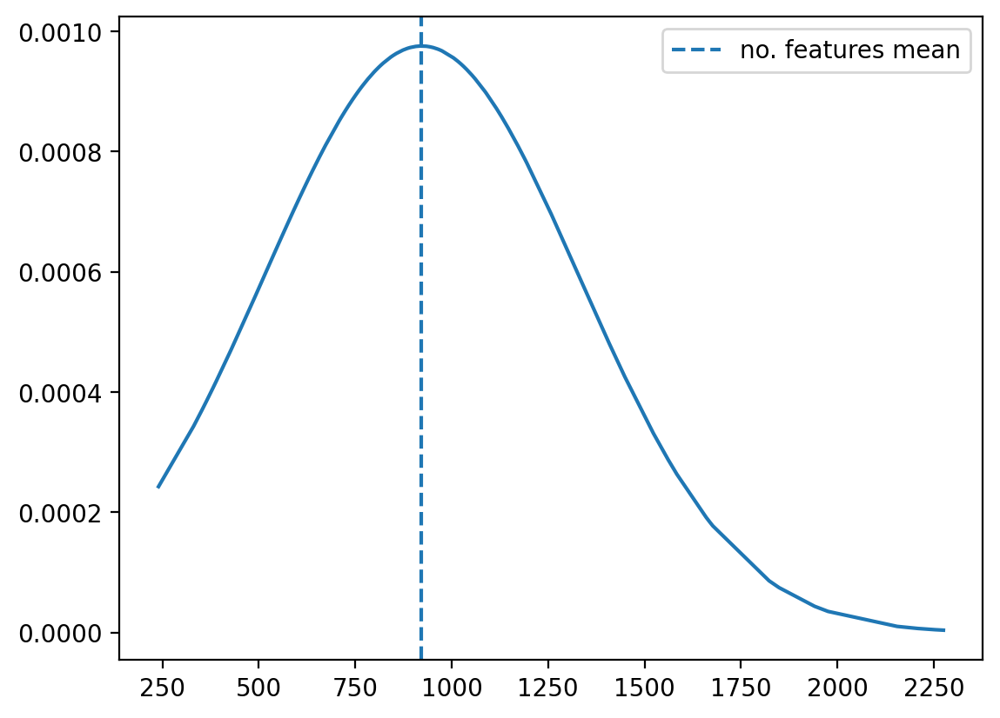

In [24]:
features = dataset_features(test_usable_images, threshold=50)
(np.array(features) < 50).sum(), len(features)

feat avg: 0.0
feat med: 0.0
feat min: 0
feat max: 0
feat std: 0.0
num images: 7
<50 feat: 7
>=50 feat: 0


/Users/lakhanmankani/University/PRBX/usability/venv/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2093: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


(7, 7)

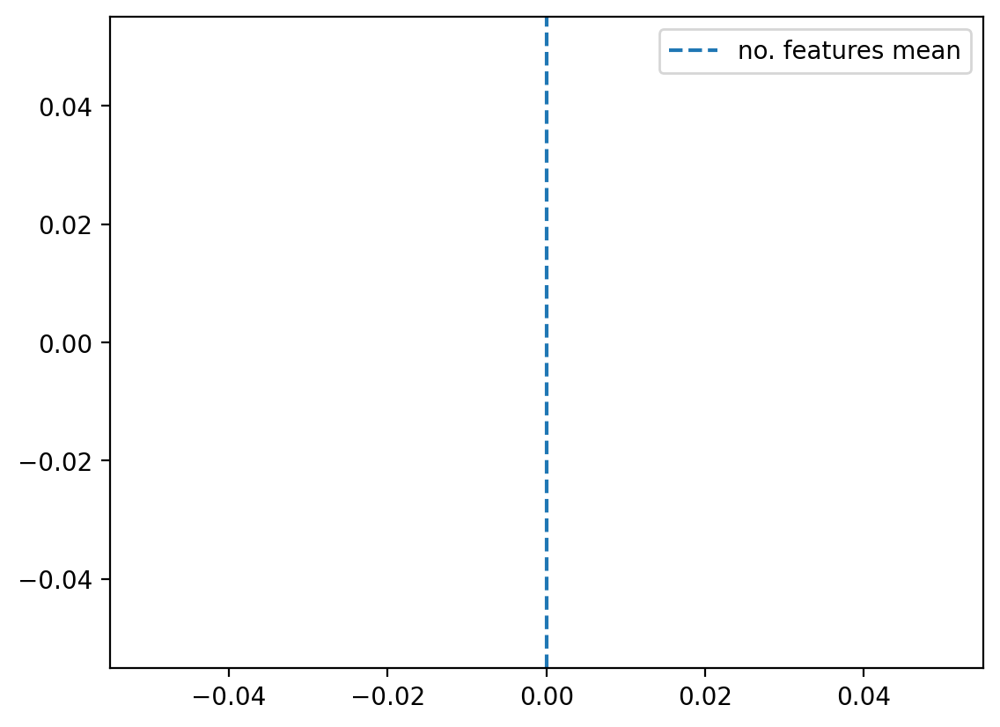

In [25]:
features = dataset_features(test_unusable_images, threshold=50)
(np.array(features) < 50).sum(), len(features)

In [26]:
l = glob.glob(f'{CONTENT_ROOT}/2016/2016-08/*.JPG')
features = dataset_features(l, threshold=50)

KeyboardInterrupt: 

In [88]:
len(sift.detect(load_resized_img(train_unusable_images[14], scale=True, color=True)))

21

In [96]:
plots = []
# Usable
img = load_resized_img(train_usable_images[500], scale=True, color=True)
img_kp = load_resized_img(train_usable_images[500], scale=True, color=True) #np.copy(img)

sift = cv2.SIFT_create()
kp = sift.detect(img, None)
_ = cv2.drawKeypoints(img, kp, img_kp)
plots.append(img)
plots.append(img_kp)

# Unusable
img = load_resized_img(train_unusable_images[14], scale=True, color=True)
img_kp = np.copy(img)

sift = cv2.SIFT_create()
kp = sift.detect(img, None)
_ = cv2.drawKeypoints(img, kp, img_kp)
plots.append(img)
plots.append(img_kp)

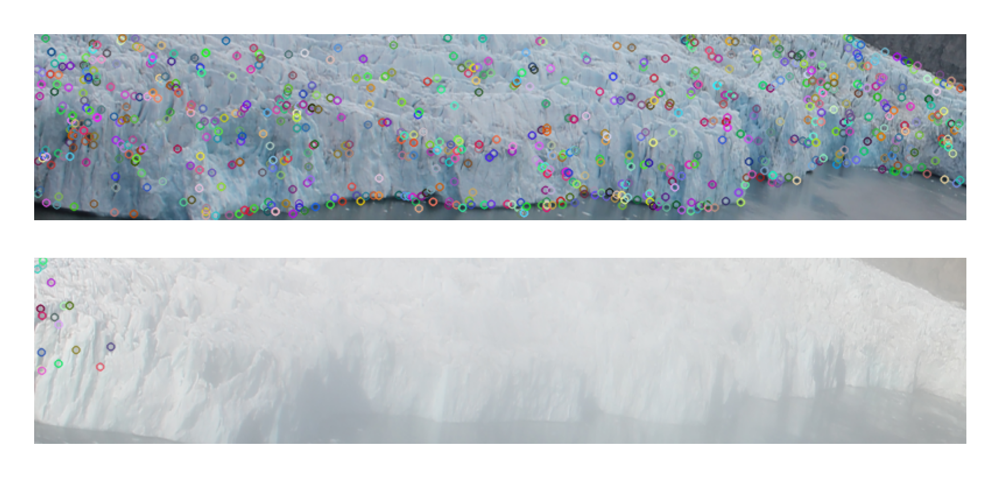

In [97]:
plt.gcf().set_dpi(300)
plt.subplots_adjust(left=0.1,
                bottom=0.05,
                right=0.9,
                top=0.3,
                wspace=0.1,
                hspace=0.2)
for i, arg in enumerate(plots[1::2]):
    plt.subplot(2, 1, i+1)
    plt.axis("off")
    plt.imshow(arg)
plt.savefig('usability-sift-features-annotated.png', dpi=1000)
plt.show()


In [59]:
from PIL import Image
for i, img in enumerate(plots):
    Image.fromarray(img).save(f'usability-figure-{i}.png')

### April 2016

feat avg: 427.65488810365133
feat med: 326.0
feat min: 0
feat max: 1875
feat std: 372.7721634521219
num images: 849
<50 feat: 81
>=50 feat: 768


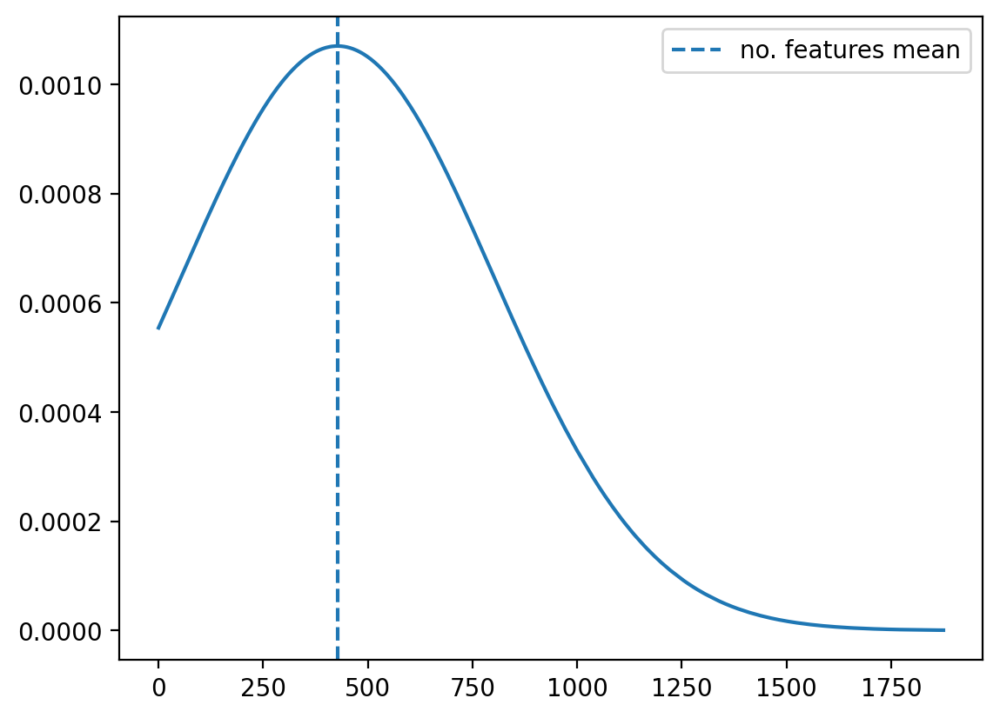

In [28]:
bounding_boxes = {
    # path: ((y_offset, x_offset), (height, width), rotation)
    "2016-07": ((1200, 0), (270, 2000), -19),
    "2016-08": ((1250, 0), (240, 2000), -17),
    "2016-04": ((1000, 0), (270, 2000), -21)
}

l = glob.glob(f'{CONTENT_ROOT}/2016/2016-04/*.JPG')[:]
features = dataset_features(l, threshold=50)
output_path = '/Users/lakhanmankani/Desktop/dataset/April-2016'
shutil.rmtree(output_path, ignore_errors=True)
save_dataset(l, features, output_path)

In [30]:
tree = ET.parse('april-2016-annotations.xml')
root = tree.getroot()

eval_all_images = []
eval_usable_images = []
eval_unusable_images = []


for child in root:
    if child.tag != 'image':
        continue
    file_name = child.attrib.get('name')
    eval_all_images.append(file_name)
    
    try: 
        next(child.iter('tag'))
    except StopIteration:
        continue    
    
    for tag in child.iter('tag'):
        if tag.attrib.get('label') == 'Usability':
            usability = next(tag.iter('attribute')).text
            if usability == 'usable':
                eval_usable_images.append(file_name)
            elif usability == 'unusable':
                eval_unusable_images.append(file_name)

In [31]:
len(eval_all_images), len(eval_usable_images), len(eval_unusable_images)

(849, 783, 66)

In [70]:
usable_correct = 0
usable_incorrect = 0
unusable_correct = 0
unusable_incorrect = 0

for file_name in eval_usable_images:
    img = load_resized_img(f'2016/2016-04/{file_name}')
    if classify(img, threshold=50) == 'usable':
        usable_correct += 1
    else:
        usable_incorrect += 1
for file_name in eval_unusable_images:
    img = load_resized_img(f'2016/2016-04/{file_name}')
    if classify(img, threshold=50) == 'unusable':
        unusable_correct += 1
    else:
        unusable_incorrect += 1
usable_accuracy = usable_correct / (usable_correct + usable_incorrect)
unusable_accuracy = unusable_correct / (unusable_correct + unusable_incorrect)
print(f'usable accuracy {usable_accuracy * 100:.2f}%')
print(f'unusable accuracy {unusable_accuracy * 100:.2f}%')

usable accuracy 97.06%
unusable accuracy 87.88%


20160418_0430_IMG_1246.JPG
20160418_0445_IMG_1247.JPG
20160418_0500_IMG_1248.JPG
20160419_0430_IMG_1342.JPG
20160420_0445_IMG_1439.JPG
20160421_0430_IMG_1534.JPG
20160421_0445_IMG_1535.JPG
20160422_0700_IMG_1640.JPG


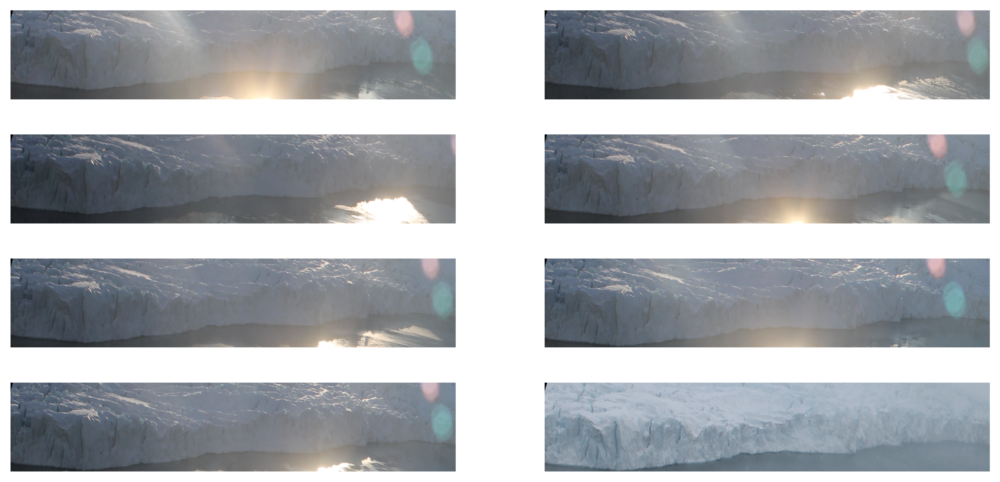

In [76]:
i = 1
plt.figure(figsize=(12,12), dpi=300)
for file_name in eval_unusable_images:
    img = load_resized_img(f'2016/2016-04/{file_name}')
    if classify(img, threshold=50) == 'unusable':
        continue
    else:
        plt.subplot(8, 2, i)
        plt.imshow(load_resized_img(f'2016/2016-04/{file_name}', color=True))
        plt.axis("off")
        i += 1
        print(file_name)

61

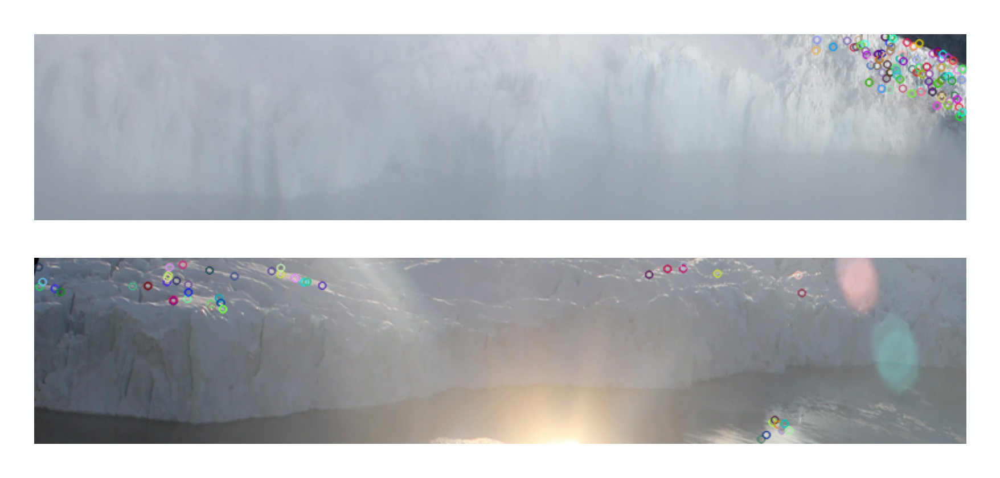

In [98]:
plt.gcf().set_dpi(300)
plt.subplots_adjust(left=0.1,
                bottom=0.05,
                right=0.9,
                top=0.3,
                wspace=0.1,
                hspace=0.2)

img1 = load_resized_img('2016/2016-08/20160803_1028_IMG_6833.JPG', color=True)
kp = sift.detect(img1, None)
img_kp = cv2.drawKeypoints(img1,kp,img1)
plt.subplot(2, 1, 1)
plt.axis("off")
plt.imshow(img1)

img2 = load_resized_img('2016/2016-04/20160418_0430_IMG_1246.JPG',color=True)
kp = sift.detect(img2, None)
img_kp = cv2.drawKeypoints(img2,kp,img2)
plt.subplot(2, 1, 2)
plt.axis("off")
plt.imshow(img2)
classify(img2)
len(kp)

In [96]:
img1 = load_resized_img('2016/2016-08/20160803_1028_IMG_6833.JPG', color=False)
kp = sift.detect(img1, None)
img_kp = cv2.drawKeypoints(img1,kp,img1)
cv2.imwrite('incorrect-unusable-a.png', img_kp)

True

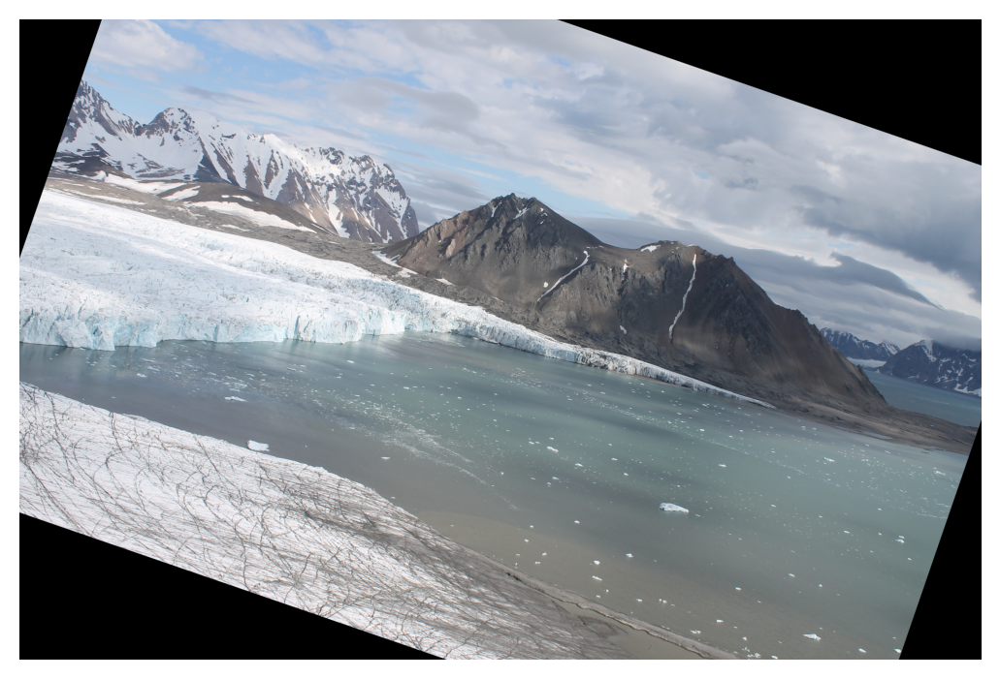

In [132]:
img = cv2.imread(f'{CONTENT_ROOT}/2016/2016-07/20160702_1148_IMG_3614.JPG', cv2.COLOR_BGR2RGB)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = rotate_image(img, -19)
plt.axis("off")
plt.imshow(img)
plt.savefig('rotation.png', dpi=300)